In [1]:
import os
import cv2
import numpy as np

import tensorflow as tf
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation
from tensorflow import data
from tensorflow.keras import layers, Input, Model
from tensorflow.keras import losses
from tensorflow.keras import optimizers

import time
from IPython import display 

import matplotlib.pyplot as plt

# 데이터 불러오기

In [2]:
data_path = os.getenv('HOME')+'/aiffel/exp19/conditional_generation/cityscape/cityscapes/train/'
print("number of train examples :", len(os.listdir(data_path)))

number of train examples : 1000


# 데이터 확인

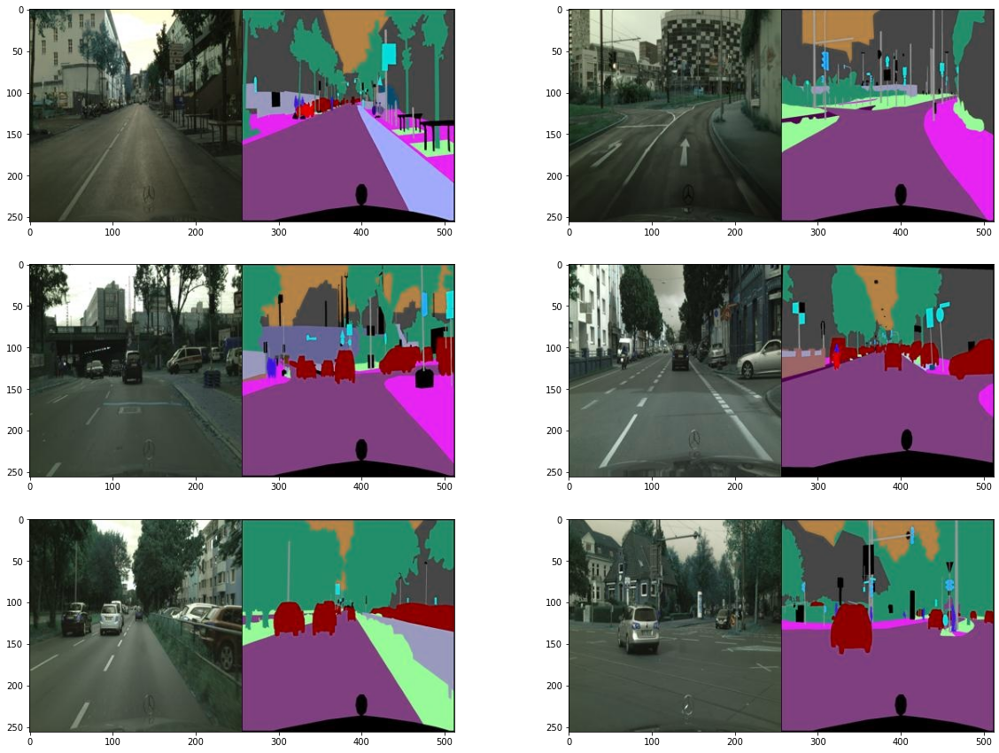

In [3]:
plt.figure(figsize=(20,15))
for i in range(1, 7):
    f = data_path + os.listdir(data_path)[np.random.randint(800)]
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(3,2,i)
    plt.imshow(img)

# 이미지 크기 확인

In [4]:
f = data_path + os.listdir(data_path)[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print(img.shape)

(256, 512, 3)


# 노멀라이즈 함수

In [5]:
def normalize(x):
    x = tf.cast(x, tf.float32)
    return (x/127.5) - 1

# 디노멀라이즈 함수

In [6]:
def denormalize(x):
    x = (x+1)*127.5
    x = x.numpy()
    return x.astype(np.uint8)

# 이미지 로드 함수

In [7]:
def load_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)
    
    w = tf.shape(img)[1] // 2
    actual_img = img[:, :w, :] 
    actual_img = tf.cast(actual_img, tf.float32)
    input_img = img[:, w:, :] 
    input_img = tf.cast(input_img, tf.float32)
    return normalize(input_img), normalize(actual_img)

# 이미지 분할

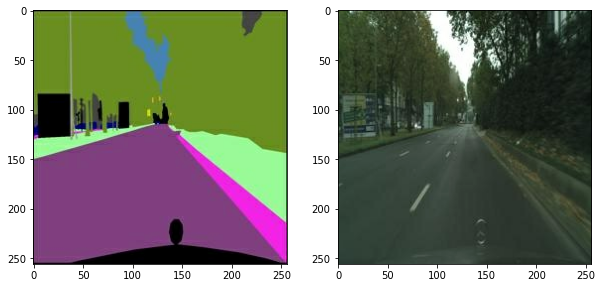

In [8]:
f = data_path + os.listdir(data_path)[1]
input_img, actual_img = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.imshow(denormalize(input_img))
plt.subplot(1,2,2); plt.imshow(denormalize(actual_img))

# Augmentation 함수

In [9]:
@tf.function()

def apply_augmentation(sketch, colored):
    stacked = tf.concat([sketch, colored], axis=-1)
    
    _pad = tf.constant([[30,30],[30,30],[0,0]])
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)

    out = image.random_crop(padded, size=[256, 256, 6])
    
    out = image.random_flip_left_right(out)
    out = image.random_flip_up_down(out)
    
    if tf.random.uniform(()) < .5:
        degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
        out = image.rot90(out, k=degree)
    
    return out[...,:3], out[...,3:]

# Augmentation 적용

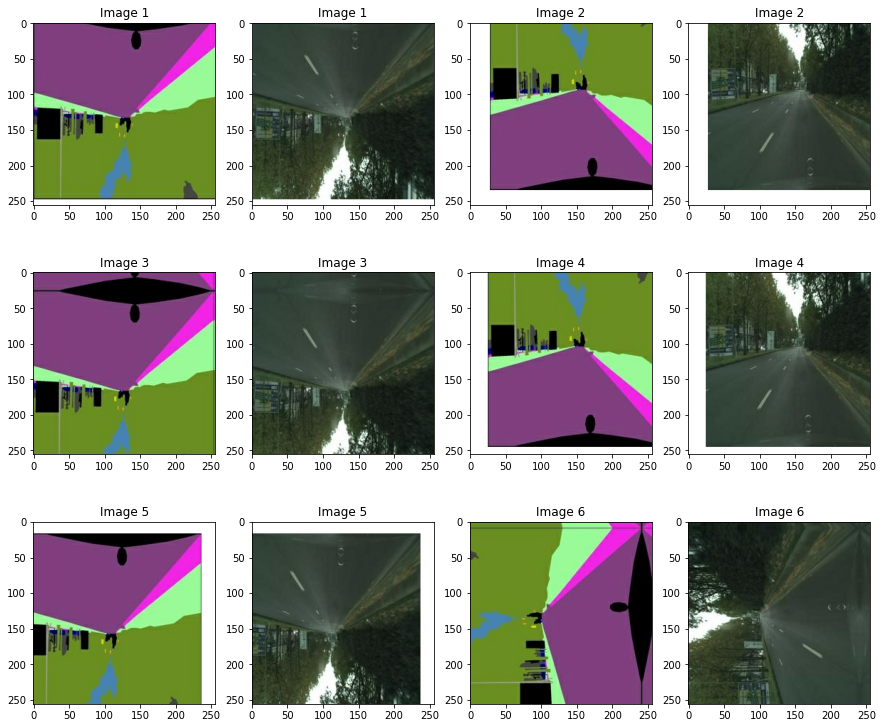

In [10]:
plt.figure(figsize=(15,13))
img_n = 1
for i in range(1, 13, 2):
    augmented_input, augmented_real = apply_augmentation(input_img, actual_img)
    
    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_input)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1) 
    plt.imshow(denormalize(augmented_real)); plt.title(f"Image {img_n}")
    img_n += 1

# 트레인 데이터 전처리 함수

In [11]:
def get_train(img_path):
    input_image, real_image = load_img(img_path)
    input_image, real_image = apply_augmentation(input_image, real_image)
    return input_image, real_image

# 트레인 데이터에 Augmentation 적용

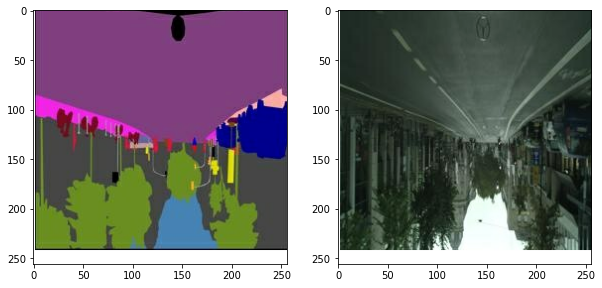

In [12]:
train_images = data.Dataset.list_files(data_path + "*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(4)

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
input_image, actual_image = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(input_image[0].astype(np.uint8))
plt.subplot(1,2,2); plt.imshow(actual_image[0].astype(np.uint8))

***

# Generator

In [13]:
class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu = layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

In [14]:
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)

In [15]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()


In [16]:
UNetGenerator().get_summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
encode_block (EncodeBlock)      (None, 128, 128, 64) 3072        input_1[0][0]                    
__________________________________________________________________________________________________
encode_block_1 (EncodeBlock)    (None, 64, 64, 128)  131584      encode_block[0][0]               
__________________________________________________________________________________________________
encode_block_2 (EncodeBlock)    (None, 32, 32, 256)  525312      encode_block_1[0][0]             
______________________________________________________________________________________________

***

# Discriminator

In [17]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x

In [18]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()

In [19]:
Discriminator().get_summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_7 (Concatenate)     (None, 256, 256, 6)  0           input_2[0][0]                    
                                                                 input_3[0][0]                    
__________________________________________________________________________________________________
disc_block (DiscBlock)          (None, 128, 128, 64) 6144        concatenate_7[0][0]        

***

# Train

# loss 정의

In [20]:
bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

# Loss Function of Generator
def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

# Loss Funtion of Discriminator
def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

### Optimizer 설정

In [21]:
gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

In [22]:
@tf.function
def train_step(input_image, ground_truth, generator, discriminator):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        gen_output = generator(input_image, training=True)
        # Discriminator 예측
        fake_disc = discriminator(input_image, gen_output, training=True)
        real_disc = discriminator(input_image, ground_truth, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(gen_output, ground_truth, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss)
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

### 체크 포인트 설정

In [23]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/exp19/conditional_generation/cityscape/cityscapes/training_checkpoints'

generator = UNetGenerator()
discriminator = Discriminator()

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=gene_opt,
                                 discriminator_optimizer=disc_opt,
                                 generator=generator,
                                 discriminator=discriminator)

### validation 데이터 확인

In [24]:
val_path = os.getenv('HOME')+'/aiffel/exp19/conditional_generation/cityscape/cityscapes/val/'

val_len = len(os.listdir(val_path))
print("The number of val examples: ", val_len)

The number of val examples:  5


# GIF 생성 함수

In [28]:
def generate_and_save_images(model, epoch, it):
    fig = plt.figure(figsize=(12, 8))

    for i in range(val_len):
        f = val_path + os.listdir(val_path)[i]
        input_image, ground_truth = load_img(f)

        pred = generator(tf.expand_dims(input_image, 0), training=False)
        pred = denormalize(pred)

        plt.subplot(1, 5, i+1)
        plt.imshow(pred[0])
        plt.axis('off')

    plt.savefig(os.getenv('HOME')+'/aiffel/exp19/conditional_generation/cityscape/cityscapes/generated_samples/sample_epoch_{:04d}_iter_{:03d}.png'.format(epoch, it))

    plt.show()

# 학습 함수

In [29]:
history = {'gen_loss':[], 'l1_loss':[], 'disc_loss':[]}

def train(train_images, epochs, save_every, generator, discriminator):
    start = time.time()

    for epoch in range(1, EPOCHS+1):
        epoch_start = time.time()
        for i, (input_image, ground_truth) in enumerate(train_images):
            g_loss, l1_loss, d_loss = train_step(input_image, ground_truth, generator, discriminator)

            history['gen_loss'].append(g_loss)
            history['l1_loss'].append(l1_loss)
            history['disc_loss'].append(d_loss)
                    
            if (i+1) % 100 == 0:
                display.clear_output(wait=False)
                generate_and_save_images(generator, epoch + 1, i + 1)
                print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                        \nGenerator_loss: {g_loss.numpy():.4f} \
                        \nL1_loss: {l1_loss.numpy():.4f} \
                        \nDiscriminator_loss: {d_loss.numpy():.4f} \
                        \nTime for epoch {epoch} : {int(time.time()-epoch_start)} sec", end="\n\n")
                train_time = time.strftime('%H:%M:%S', time.gmtime(int(time.time()-start)))
                print(f'>>>> Time for training: {train_time}', end="\n\n")
                
        if epoch % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix) # save checkpoint

        display.clear_output(wait=False)
        generate_and_save_images(generator, epoch, i)
        train_time = time.strftime('%H:%M:%S', time.gmtime(int(time.time()-start)))
        print(f'>>>> Time for training: {train_time}', end="\n\n")

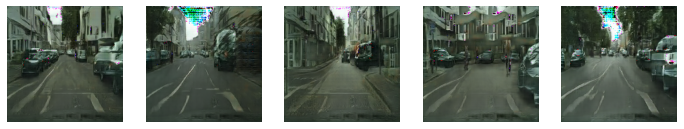

EPOCH[323] - STEP[100]                         
Generator_loss: 0.9070                         
L1_loss: 0.2008                         
Discriminator_loss: 0.6298                         
Time for epoch 323 : 35 sec

>>>> Time for training: 07:55:19



KeyboardInterrupt: 

In [30]:
EPOCHS = 500
save_every = 100

train(train_images, EPOCHS, save_every, generator, discriminator)

***

# history 출력

In [31]:
def plot_history(history):
    plt.figure(figsize=(16,10))
    plt.subplots_adjust(left=0.125, bottom=0.1,  right=0.9, top=0.9, wspace=0.2, hspace=0.35)

    plt.subplot(311)
    plt.plot(history['gen_loss'])
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.title('Generator Loss', fontsize=20)

    plt.subplot(312) 
    plt.plot(history['l1_loss'])
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.title('L1 Loss', fontsize=20)

    plt.subplot(313)
    plt.plot(history['disc_loss'])
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.title('Discriminator Loss', fontsize=20)
    plt.show()

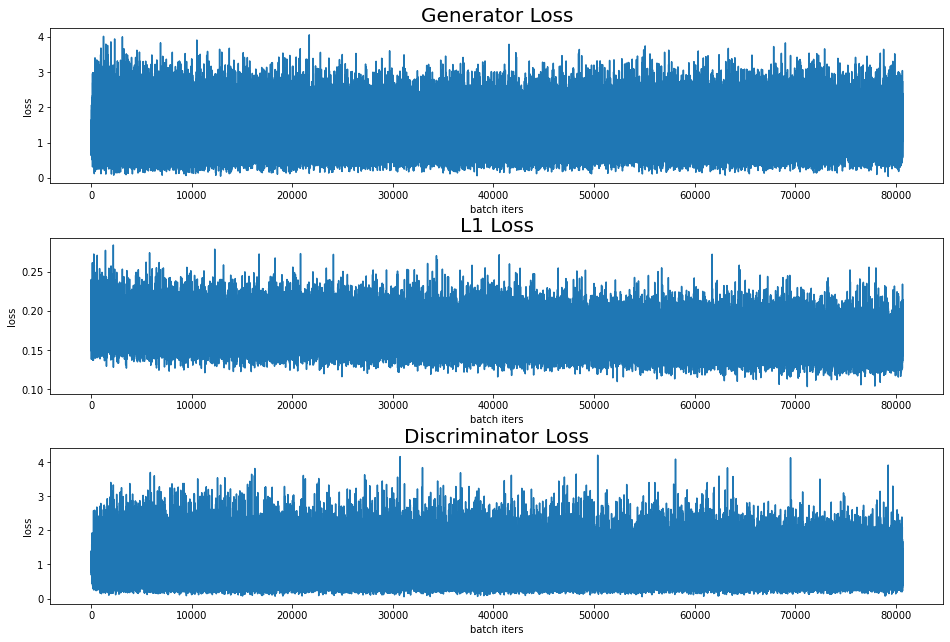

In [32]:
plot_history(history)

# GIF 출력

In [33]:
import imageio
import glob

anim_file = os.getenv('HOME')+'/aiffel/exp19/conditional_generation/cityscape/cityscapes/cityscape.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob(os.getenv('HOME')+'/aiffel/exp19/conditional_generation/cityscape/cityscapes/generated_samples/sample*.png')
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

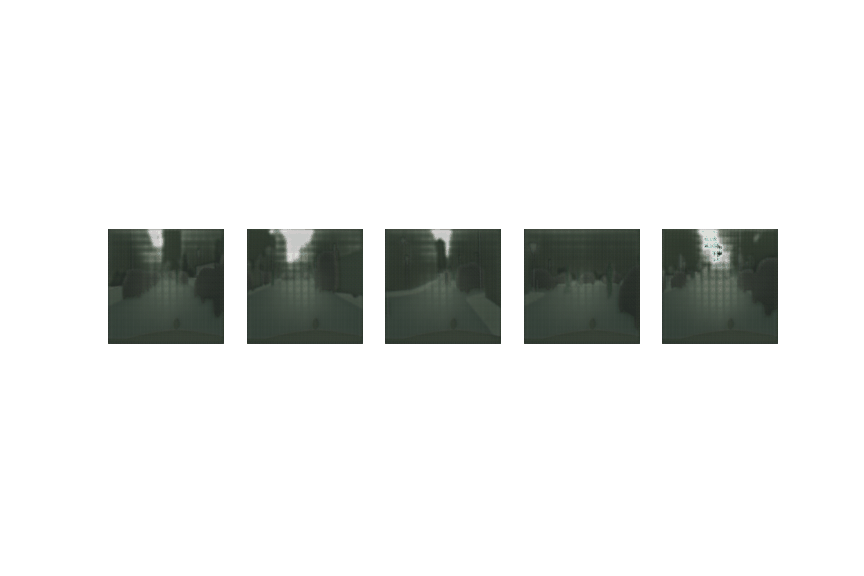

In [34]:
from IPython.display import Image

Image(open(anim_file,'rb').read())

***

# 이미지 생성

In [35]:
def print_generated_images(n=5):
    for i in range(n):
        f = val_path + os.listdir(val_path)[i] # validataion data images
        input_image, ground_truth = load_img(f)

        pred = generator(tf.expand_dims(input_image, 0))
        pred = denormalize(pred)

        plt.figure(figsize=(20,10))
        plt.subplot(1,3,1); plt.imshow(denormalize(input_image)); plt.title('Input Image', fontsize=20)
        plt.subplot(1,3,2); plt.imshow(pred[0]); plt.title('Generated Image', fontsize=20)
        plt.subplot(1,3,3); plt.imshow(denormalize(ground_truth)); plt.title('Ground Truth', fontsize=20)

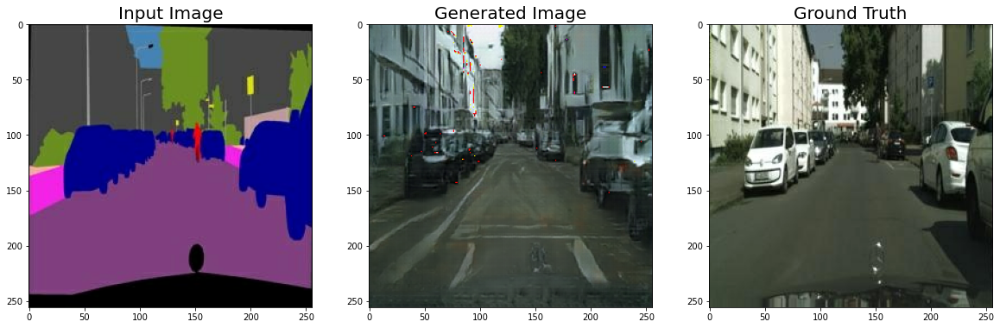

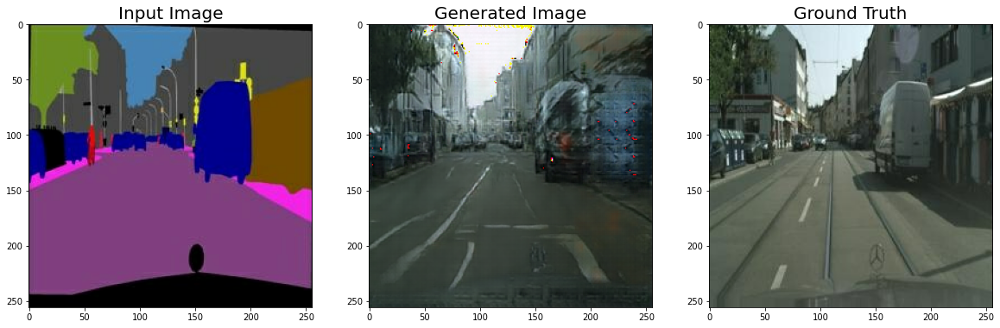

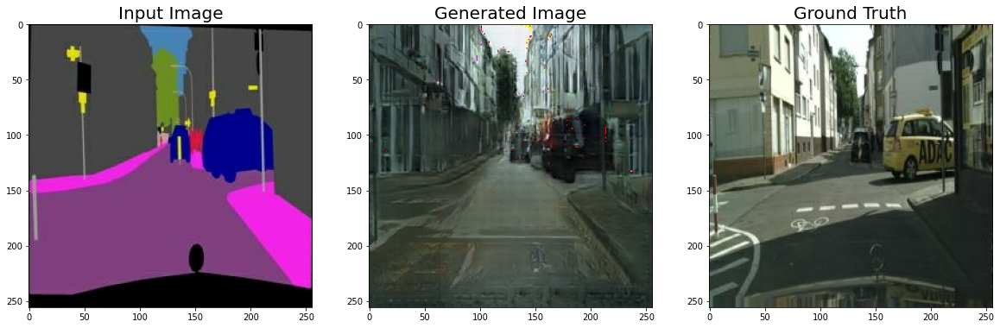

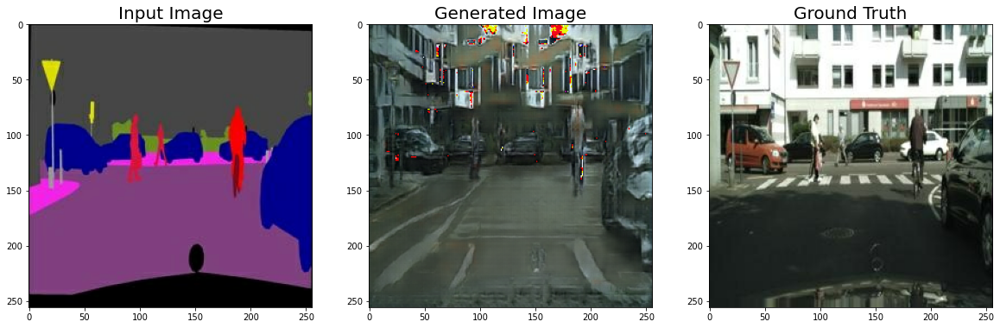

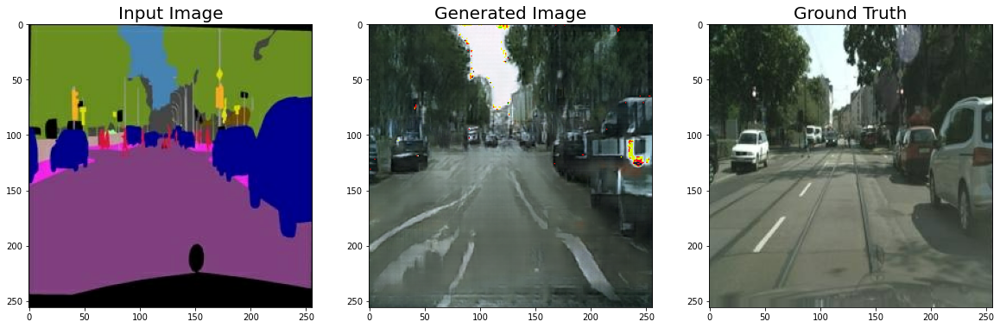

In [36]:
print_generated_images()

***

# 고찰
  
완벽한 이미지는 아니지만 그래도 멀리서 보면 꽤나 그럴듯한 이미지가 생성되었습니다.  
지금까지 사용한 GAN 기법 중에서는 가장 성능이 좋아 보입니다.  
하지만 학습 시간이 매우 많이 걸린다는 것은 변함이 없어보입니다.  